In [1]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

print("PyTorch version:", torch.__version__)
print("CUDA is available:", torch.cuda.is_available())

!git clone https://github.com/SysCV/sam-hq.git
!pip install timm
os.chdir('sam-hq')
!export PYTHONPATH=$(pwd)
from segment_anything import sam_model_registry, SamPredictor,SamAutomaticMaskGenerator


PyTorch version: 2.1.0+cu121
CUDA is available: True
Cloning into 'sam-hq'...
remote: Enumerating objects: 443, done.
remote: Counting objects: 100% (181/181), done.
remote: Compressing objects: 100% (118/118), done.
remote: Total 443 (delta 105), reused 71 (delta 63), pack-reused 262
Receiving objects: 100% (443/443), 42.16 MiB | 15.87 MiB/s, done.
Resolving deltas: 100% (202/202), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 7.0 MB/s eta 0:00:00


/content/sam-hq/segment_anything/modeling/tiny_vit_sam.py:662: UserWarning: Overwriting tiny_vit_5m_224 in registry with segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/content/sam-hq/segment_anything/modeling/tiny_vit_sam.py:662: UserWarning: Overwriting tiny_vit_11m_224 in registry with segment_anything.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/content/sam-hq/segment_anything/modeling/tiny_vit_sam.py:662: UserWarning: Overwriting tiny_vit_21m_224 in registry with segment_anything.modeling.tiny_vit_sam.tiny_vit_21m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/content/sam-hq/se

In [2]:
!mkdir pretrained_checkpoint
#!wget https://huggingface.co/lkeab/hq-sam/resolve/main/sam_hq_vit_l.pth
!wget https://huggingface.co/lkeab/hq-sam/resolve/main/sam_hq_vit_h.pth
#!mv sam_hq_vit_l.pth pretrained_checkpoint
!mv sam_hq_vit_h.pth pretrained_checkpoint


--2023-12-20 12:55:41--  https://huggingface.co/lkeab/hq-sam/resolve/main/sam_hq_vit_h.pth
Resolving huggingface.co (huggingface.co)... 18.164.174.118, 18.164.174.23, 18.164.174.55, ...
Connecting to huggingface.co (huggingface.co)|18.164.174.118|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.huggingface.co/repos/d9/4e/d94e04992ac4e3ea45fcc1c523974540cdbef274e295d4aaacc69b4f19ee63b7/a7ac14a085326d9fa6199c8c698c4f0e7280afdbb974d2c4660ec60877b45e35?response-content-disposition=attachment%3B+filename*%3DUTF-8%27%27sam_hq_vit_h.pth%3B+filename%3D%22sam_hq_vit_h.pth%22%3B&Expires=1703336141&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTcwMzMzNjE0MX19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy5odWdnaW5nZmFjZS5jby9yZXBvcy9kOS80ZS9kOTRlMDQ5OTJhYzRlM2VhNDVmY2MxYzUyMzk3NDU0MGNkYmVmMjc0ZTI5NWQ0YWFhY2M2OWI0ZjE5ZWU2M2I3L2E3YWMxNGEwODUzMjZkOWZhNjE5OWM4YzY5OGM0ZjBlNzI4MGFmZGJiOTc0ZDJjNDY2MGVjNjA4NzdiNDVlMzU%7EcmVzcG

In [3]:

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


def show_res(masks, scores, input_point, input_label, input_box, image):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10,10))
        plt.imshow(image)
        show_mask(mask, plt.gca())
        if input_box is not None:
            box = input_box[i]
            show_box(box, plt.gca())
        if (input_point is not None) and (input_label is not None):
            show_points(input_point, input_label, plt.gca())

        print(f"Score: {score:.3f}")
        plt.axis('off')
        plt.show()


def show_res_multi(masks, scores, input_point, input_label, input_box, image):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for mask in masks:
        show_mask(mask, plt.gca(), random_color=True)
    for box in input_box:
        show_box(box, plt.gca())
    for score in scores:
        print(f"Score: {score:.3f}")
    plt.axis('off')
    plt.show()

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)


In [4]:
#sam_checkpoint = "pretrained_checkpoint/sam_hq_vit_l.pth"
#model_type = "vit_l"
sam_checkpoint = "pretrained_checkpoint/sam_hq_vit_h.pth"
model_type = "vit_h"
device = "cuda"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
predictor = SamPredictor(sam)

#auto-mask
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=1,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

#auto-mask
mask_generator2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=1,
    stability_score_thresh=0.98 ,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    crop_nms_thresh= 0.7,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)


<All keys matched successfully>


(1024, 1024, 3)
Score: 0.950


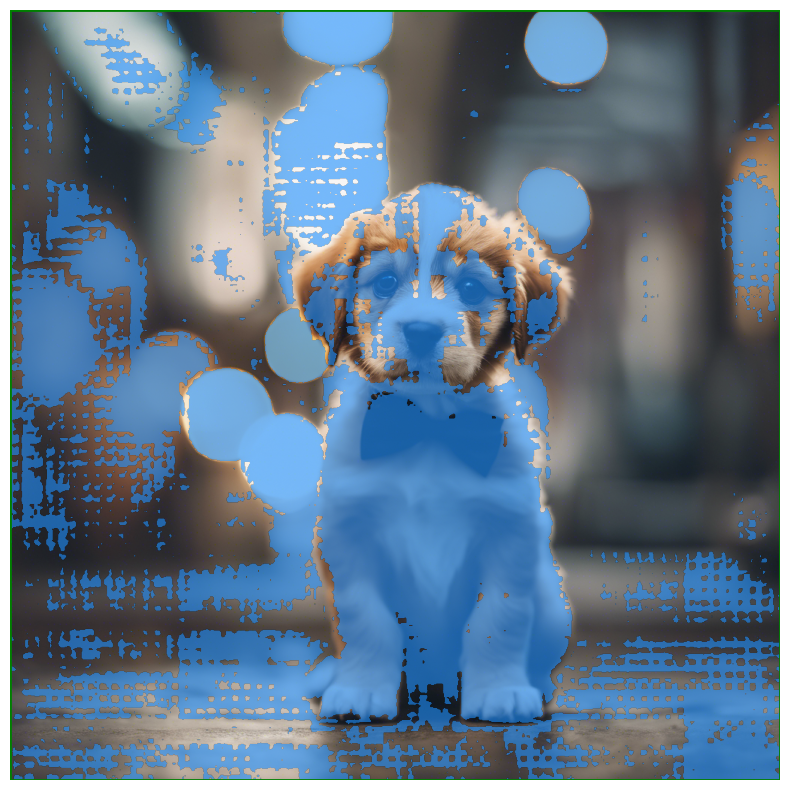

In [7]:
# vit-high version
image = cv2.imread('/content/강아지-ai-generated-flamel (1).png')
print(image.shape)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#input_box = np.array([[4,13,2688,1536]])
input_box = np.array([[0,0,image.shape[0],image.shape[1]]])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= False,
)
show_res(masks,scores,input_point, input_label, input_box, image)

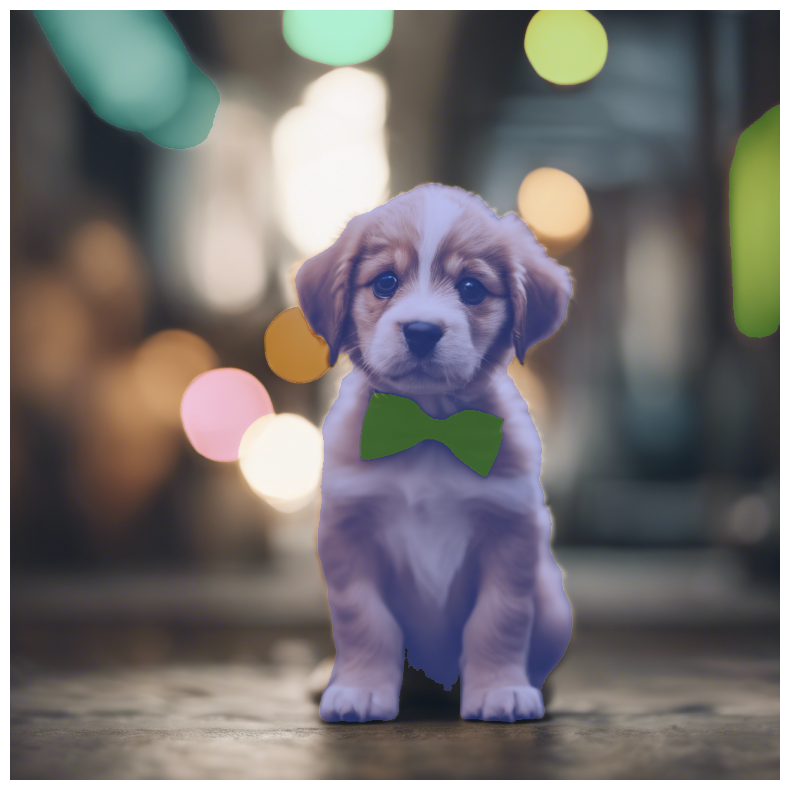

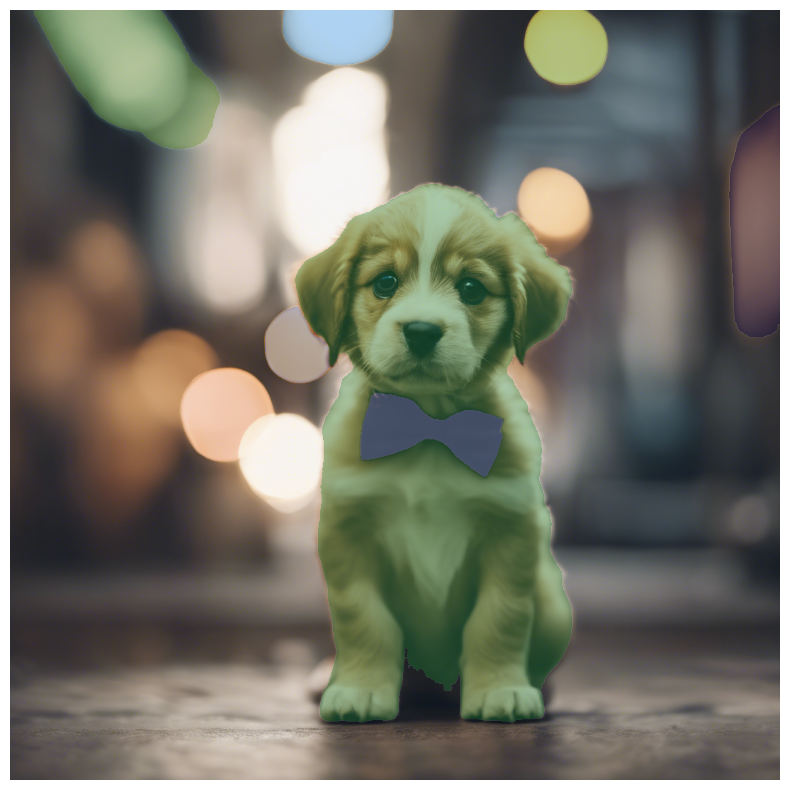

In [8]:
# vit-high version
image = cv2.imread('/content/강아지-ai-generated-flamel (1).png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

"""
#input_box = np.array([[4,13,2688,1536]])
input_box = np.array([[0,0,1536,2688]])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict( #threshold :0.88, 0.95
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= False,
)
show_res(masks,scores,input_point, input_label, input_box, image)
"""

#auto-mask
auto_mask = mask_generator.generate(image)
plt.figure(figsize=(10,10))
plt.imshow(image)
show_anns(auto_mask)
plt.axis('off')
plt.show()

#auto-mask2
auto_mask2 = mask_generator2.generate(image)
plt.figure(figsize=(10,10))
plt.imshow(image)
show_anns(auto_mask2)
plt.axis('off')
plt.show()

In [ ]:
auto_mask

Score: 0.894


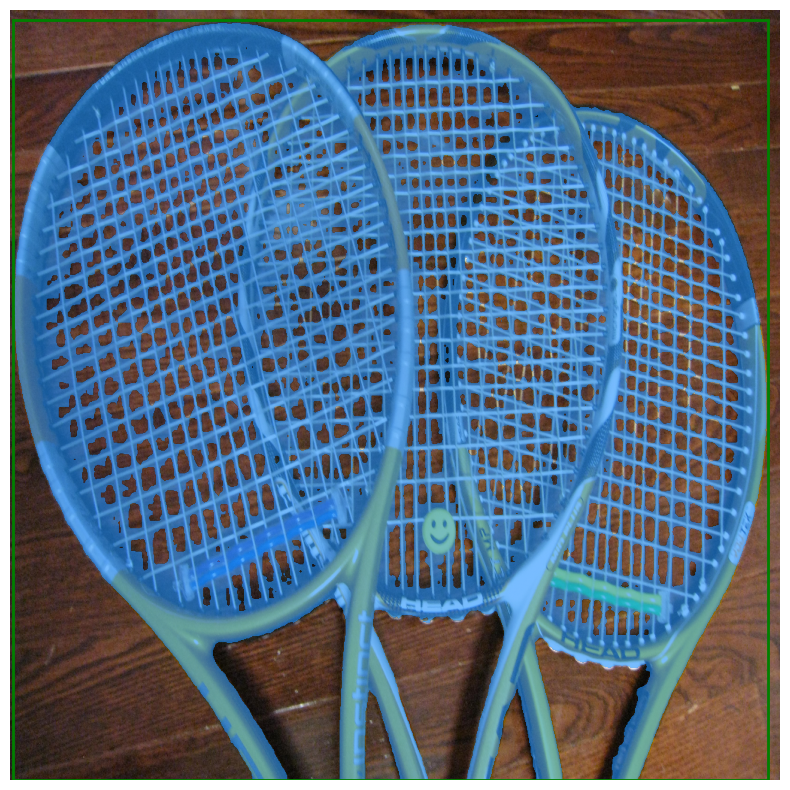

In [ ]:
# vit-light version
image = cv2.imread('demo/input_imgs/example0.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_box = np.array([[4,13,1007,1023]])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= False,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.721


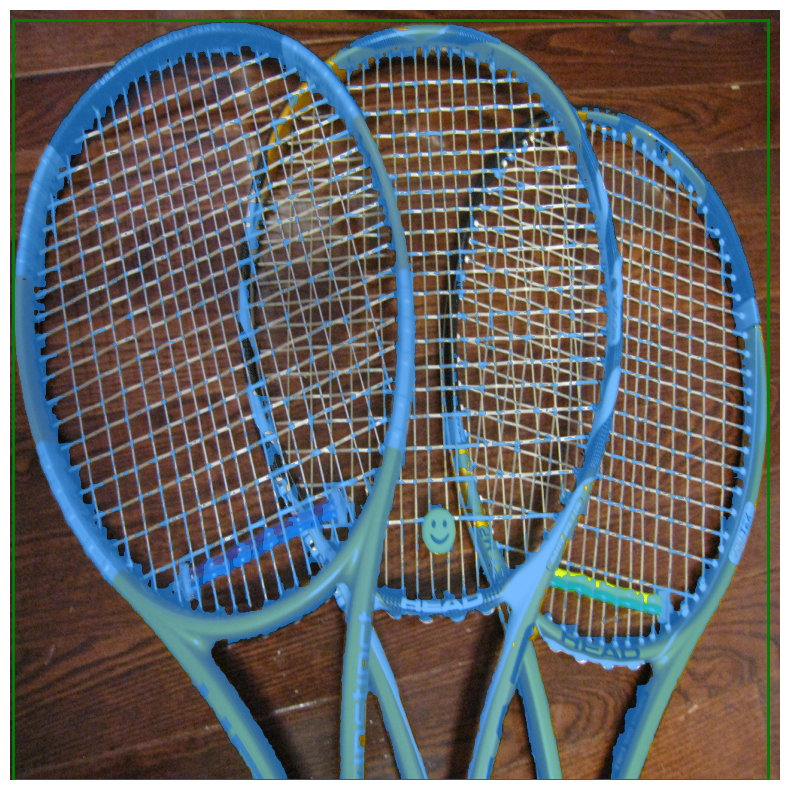

In [ ]:
# vit-high version
image = cv2.imread('demo/input_imgs/example0.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_box = np.array([[4,13,1007,1023]])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= False,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.891


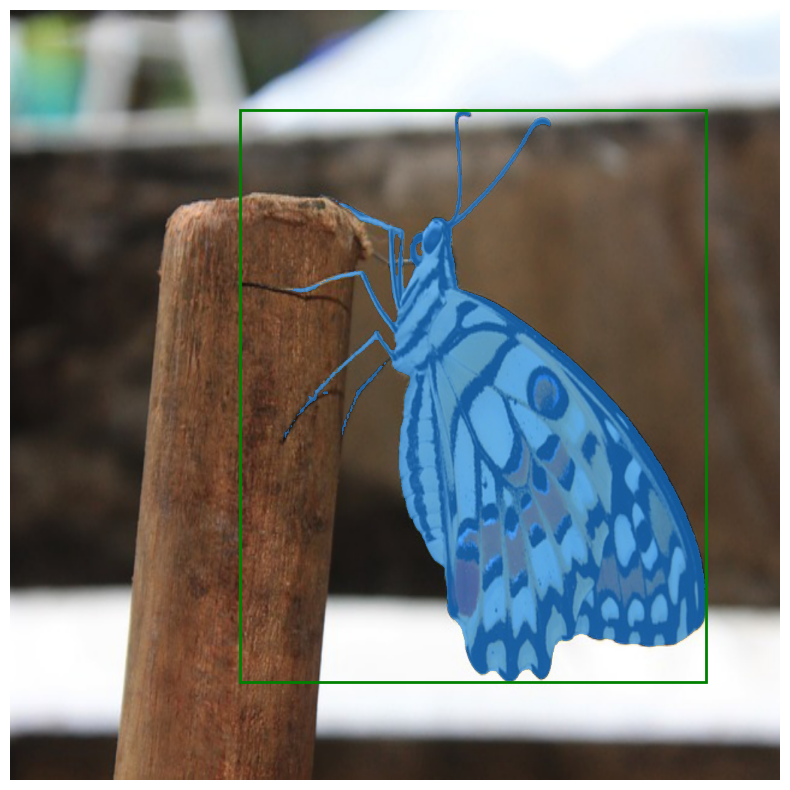

In [ ]:
# vit-light version
image = cv2.imread('demo/input_imgs/example1.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_box = np.array([[306, 132, 925, 893]])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= True,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.964


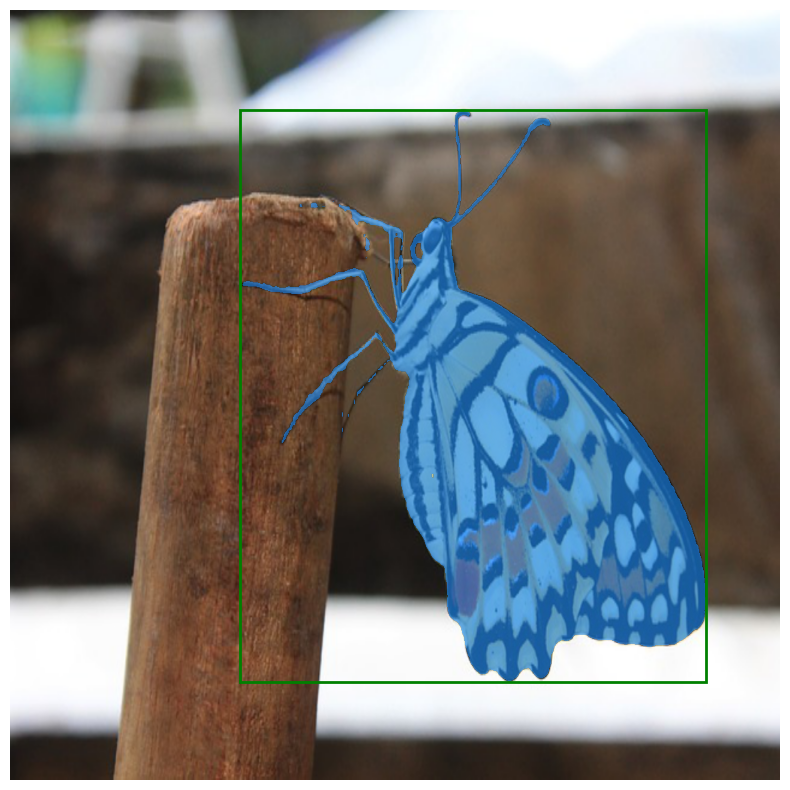

In [ ]:
# vit-h version
image = cv2.imread('demo/input_imgs/example1.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_box = np.array([[306, 132, 925, 893]])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= True,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.920


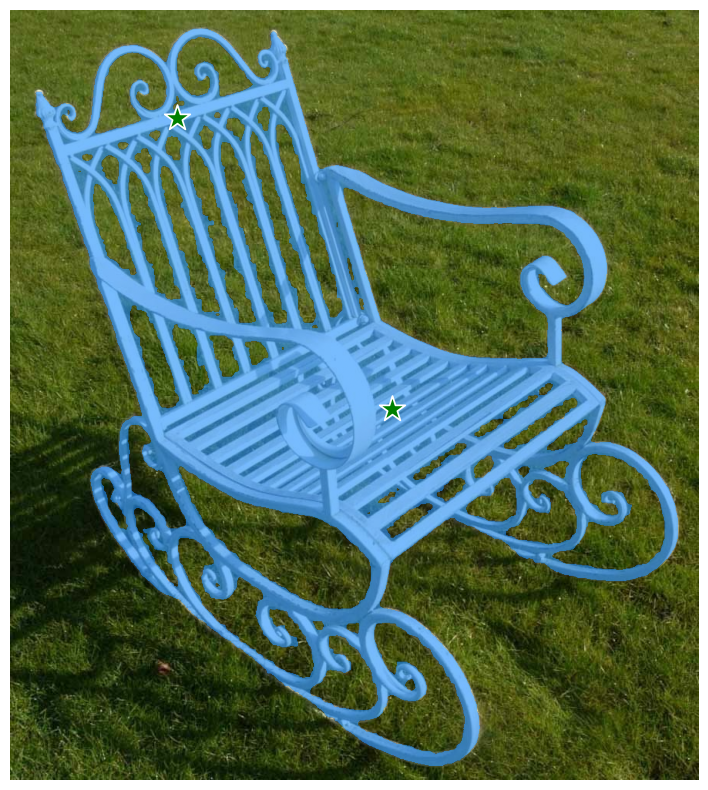

In [ ]:
image = cv2.imread('demo/input_imgs/example2.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_point = np.array([[495,518],[217,140]])
input_label = np.ones(input_point.shape[0])
input_box = None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= True,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.911


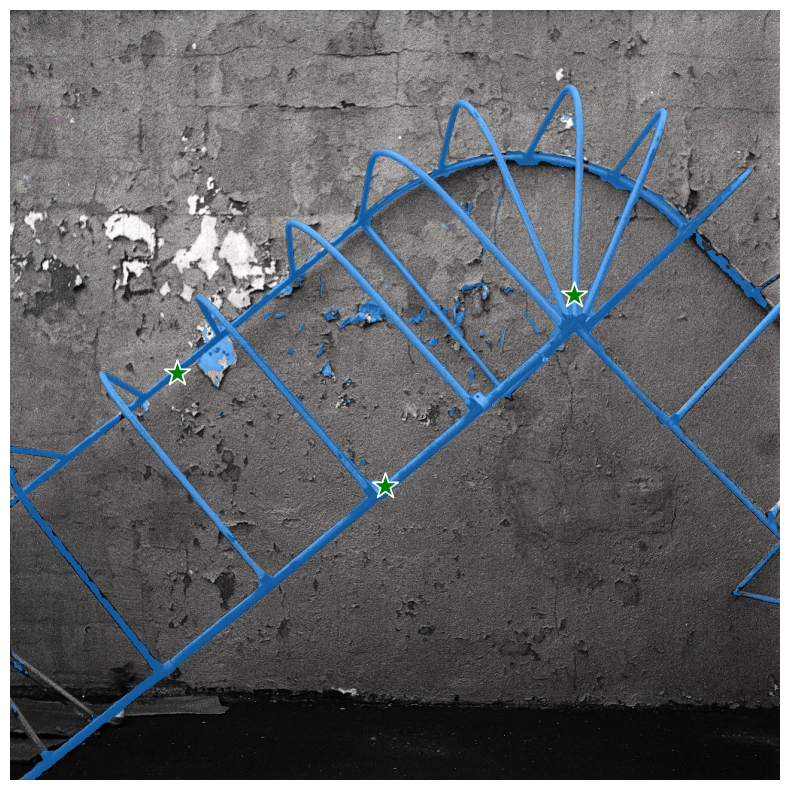

In [ ]:
image = cv2.imread('demo/input_imgs/example3.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_point = np.array([[221,482],[498,633],[750,379]])
input_label = np.ones(input_point.shape[0])
input_box = None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= False,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.973


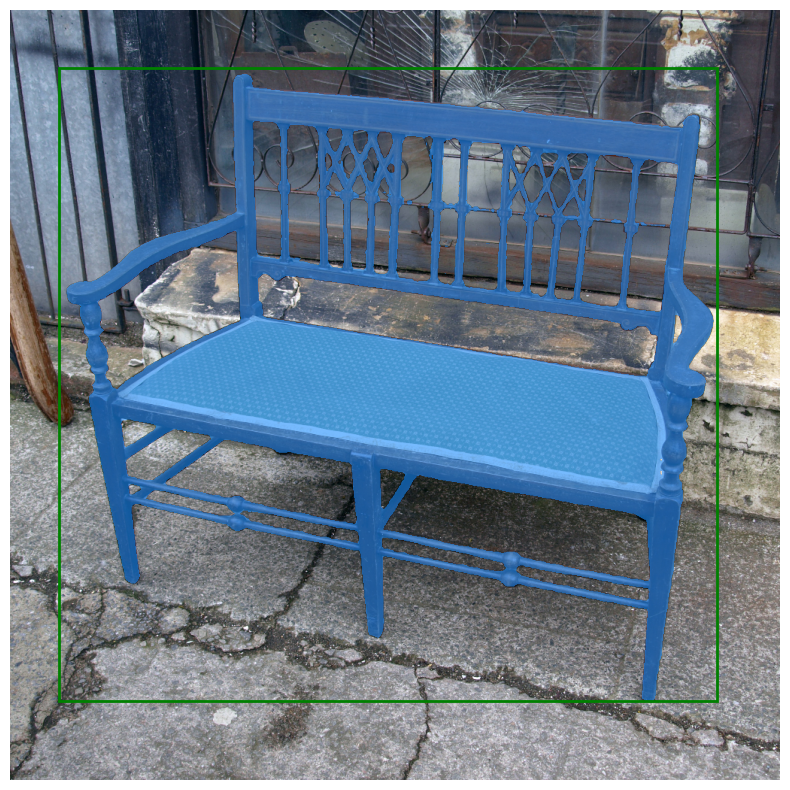

In [ ]:
image = cv2.imread('demo/input_imgs/example4.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_box = np.array([[64,76,940,919]])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= True,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.967


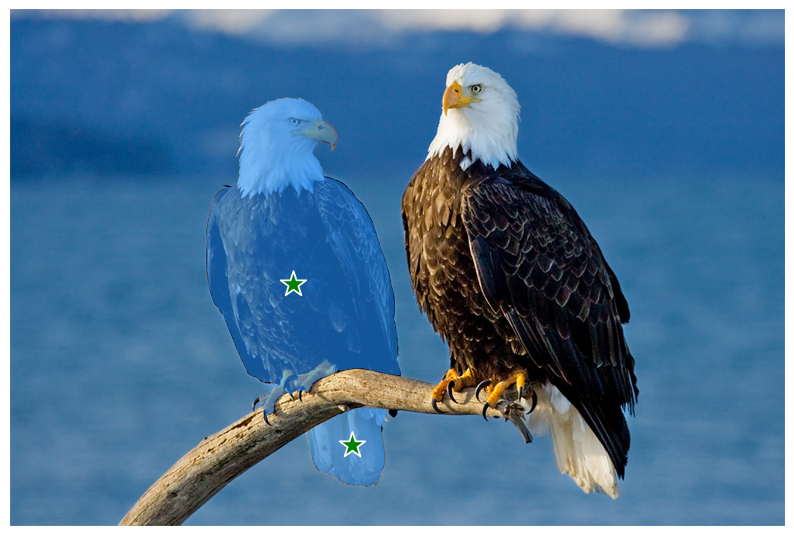

In [ ]:
image = cv2.imread('demo/input_imgs/example5.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_point = np.array([[373,363], [452, 575]])
input_label = np.ones(input_point.shape[0])
input_box = None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= False,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.990


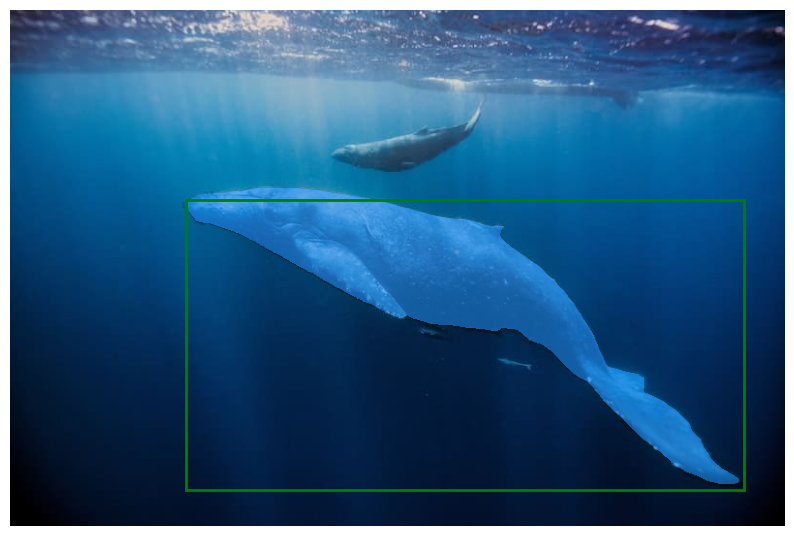

In [ ]:
image = cv2.imread('demo/input_imgs/example6.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_box = np.array([[181, 196, 757, 495]])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box = input_box,
    multimask_output=False,
    hq_token_only= False,
)
show_res(masks,scores,input_point, input_label, input_box, image)

Score: 0.715
Score: 0.968


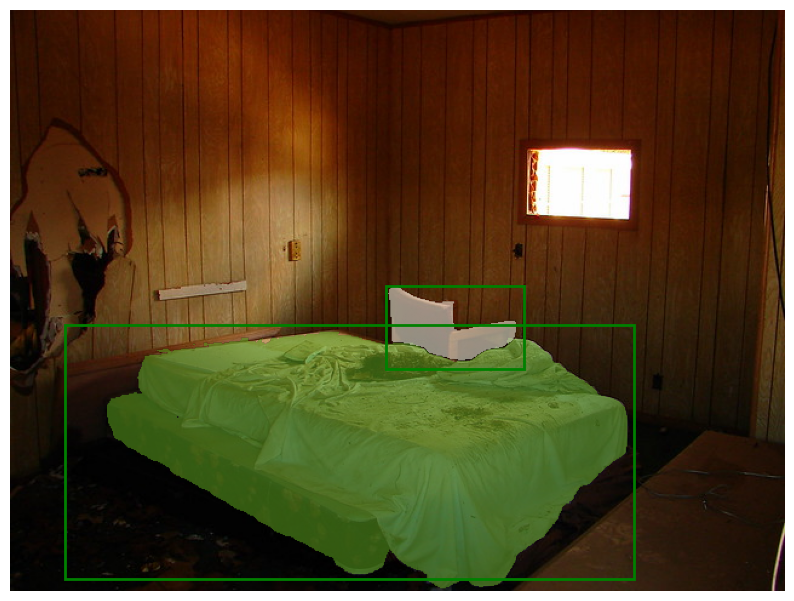

In [ ]:
image = cv2.imread('demo/input_imgs/example7.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# multi box input
input_box = torch.tensor([[45,260,515,470], [310,228,424,296]],device=predictor.device)
transformed_box = predictor.transform.apply_boxes_torch(input_box, image.shape[:2])
input_point, input_label = None, None
predictor.set_image(image)
masks, scores, logits = predictor.predict_torch(
    point_coords=input_point,
    point_labels=input_label,
    boxes=transformed_box,
    multimask_output=False,
    hq_token_only=False,
)
masks = masks.squeeze(1).cpu().numpy()
scores = scores.squeeze(1).cpu().numpy()
input_box = input_box.cpu().numpy()
show_res_multi(masks, scores, input_point, input_label, input_box, image)

In [6]:
!pip install langdetect
!pip install googletrans

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 7.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993225 sha256=56c6a32c1d6e3e081ed06fc284d63b6e154779ac78e3ac17bf279efbdf83dc1f
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [17]:
#특정폴더에 있는 이미지 전체 실행

import os
import cv2
import re
from langdetect import detect
from googletrans import Translator

# multi box input
input_box = None
input_point=None


# Define the directory paths
"""
input_directory = '/content/drive/MyDrive/스모어톡/프리렌서/배경제거/sam_test/input/input_rgb'
output_mask_direc = '/content/drive/MyDrive/스모어톡/프리렌서/배경제거/sam_test/output/matte_anything/hq_mask'
output_alpha_direc = '/content/drive/MyDrive/스모어톡/프리렌서/배경제거/sam_test/output/matte_anything/hq_alpha'
output_foreground_mask_direc = '/content/drive/MyDrive/스모어톡/프리렌서/배경제거/sam_test/output/matte_anything/hq_foreground_mask'
output_foreground_alpha_direc = '/content/drive/MyDrive/스모어톡/프리렌서/배경제거/sam_test/output/matte_anything/hq_foreground_alpha'
output_foreground_mew_dg_1_direc = '/content/drive/MyDrive/스모어톡/프리렌서/배경제거/sam_test/output/matte_anything/hq_new_bg_1'
"""
input_directory = '/content/'
output_mask_direc = '/content/output/hq_mask'



translator = Translator()


for filename in os.listdir(input_directory):
    if filename.endswith(".png") and "-ai-generated" in filename:
        img_path = os.path.join(input_directory, filename)

        # Read the image
        input_x = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
        predictor.set_image(input_x)

        #fg_caption 그때그때 설정해주기...automatic안되나......
        fg_caption = re.search(r"^(.*?)-ai-generated.*\.png$", filename).group(1).strip()
        print(fg_caption)

        # fg_caption 한글이면 영어로 바꿔주기. 한글, 영어 둘다 아니면 pass....
        if len(fg_caption) < 3:  # Example threshold; adjust as needed
            fg_caption = ""  # Set fg_caption to empty string

        else:
            # Detect language
            try:
                detected_language = detect(fg_caption)

                # Check detected language and perform operations accordingly
                if detected_language == 'ko':
                    # Translate Korean text to English
                    translated = translator.translate(fg_caption, src='ko', dest='en')
                    print(translated.text)
                    fg_caption = translated.text
                elif detected_language == 'en':
                    pass  # The text is already in English
                else:
                    pass  # Handle other languages if needed

            except Exception as e:
                print(f"Error in language detection: {e}")
                pass  # Handle the error gracefully

        transformed_box = None
        # Perform inference on the image (replace this with your inference function)
        masks, scores, logits = predictor.predict_torch(
        point_coords=input_point,
        point_labels=fg_caption,
        boxes=transformed_box,
        multimask_output=False,
        hq_token_only=False,
        )
        masks = masks.squeeze(1).cpu().numpy()
        scores = scores.squeeze(1).cpu().numpy()
        #input_box = input_box.cpu().numpy()

        print("masks",masks)
        print("scores", scores)

        # Save the outputs (adjust paths and filenames as needed)
        cv2.imwrite(os.path.join(output_mask_direc, f"{filename}_mask.png"), (masks * 255).astype(np.uint8))
        cv2.imwrite(os.path.join(output_mask_direc, f"{filename}_mask.png"), masks.astype(np.uint8))


강아지
Error in language detection: 'NoneType' object has no attribute 'group'
masks [[[False False False ... False False False]
  [False False False ... False False False]
  [False False False ... False False False]
  ...
  [False False False ... False False False]
  [False False False ... False False False]
  [False False False ... False False False]]]
scores [0.46511638]
